The Purpose of this project is to be able to use DCGANs for anime character generation. This project will take a dataset of anime faces that are cropped and attempt to create similar to what the dataset holds. I trained this for 50 epochs on this platform for demonstration purposes. Train more for better results.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input/animeface-character-dataset/animeface-character-dataset/data/"))

# Any results you write to the current directory are saved as output.

['face_375_158_71.png', 'face_597_124_56.png', 'face_826_229_53.png', 'face_284_170_140.png', 'face_103_685_41.png', 'face_284_170_5.png', 'face_382_184_43.png', 'face_319_385_157.png', 'face_407_165_131.png', 'face_227_227_23.png', 'face_270_186_24.png', 'face_822_189_15.png', 'face_776_149_84.png', 'face_237_110_63.png', 'face_174_224_148.png', 'face_126_237_156.png', 'face_332_103_28.png', 'face_92_448_124.png', 'face_512_211_1.png', 'face_543_405_29.png', 'face_272_118_117.png', 'face_198_583_40.png', 'face_325_337_84.png', 'face_246_284_15.png', 'face_465_179_101.png', 'face_72_202_106.png', 'face_488_197_135.png', 'face_89_298_24.png', 'face_1227_197_13.png', 'face_498_519_58.png', 'face_1123_316_115.png', 'face_535_581_11.png', 'face_592_190_2.png', 'face_321_256_75.png', 'face_1091_381_95.png', 'face_149_99_116.png', 'face_458_158_29.png', 'face_363_379_109.png', 'face_181_181_67.png', 'face_379_142_66.png', 'face_257_128_38.png', 'face_284_189_1.png', 'face_369_211_92.png', 'f

In [2]:
import numpy as np 
import pandas as pd 
import os
import time
import tensorflow as tf
import numpy as np
import glob
from glob import glob
import datetime
import random
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import keras
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D , Conv2DTranspose
from keras.models import Sequential, Model
from keras.optimizers import Adam

import warnings
warnings.filterwarnings("ignore")
# Impoort all packages and ensure that they are all installed within the library

Using TensorFlow backend.


In [3]:
# Hyperparameters

# The Hyperparameters are to ensure the training of the model. I found these to be fit best to ensure the modal doesnt collapse. You may experiment with these values.
IMAGE_SIZE = 64
NOISE_SIZE = 100
LR_D = 0.00004
LR_G = 0.0004
BATCH_SIZE = 32
EPOCHS = 50 # For better results increase this value
BETA1 = 0.5
WEIGHT_INIT_STDDEV = 0.02
EPSILON = 0.00005
SAMPLES_TO_SHOW = 8


In [4]:
# Create Generator
def get_generator(z=(NOISE_SIZE,)):
    # 4 x 4 x 512
    input_layer = Input(z)
    hid = Dense(4*4*512, activation='relu', name ="Dense")(input_layer)    
    hid = LeakyReLU(alpha=0.2)(hid)
    hid = Reshape((4, 4, 512))(hid)

    # 4x4x512 -> 8x8x512
    hid = Conv2DTranspose(512, kernel_size=[5,5],
                               strides=[2,2],
                               padding="same",
                               kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),name ="trans_conv1")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_trans_conv1")(hid)
    hid = LeakyReLU(alpha=0.2,name ="trans_conv1_out")(hid)
    

    # 8x8x512 -> 16x16x256
    hid = Conv2DTranspose(256, kernel_size=[5,5],
                               strides=[2,2],
                               padding="same",
                               kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),name ="trans_conv2")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_trans_conv2")(hid)
    hid = LeakyReLU(alpha=0.2,name ="trans_conv2_out")(hid)
    
    
    # 16x16x256 -> 32x32x128
    hid = Conv2DTranspose(128, kernel_size=[5,5],
                               strides=[2,2],
                               padding="same",
                               kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),name ="trans_conv3")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_trans_conv3")(hid)
    hid = LeakyReLU(alpha=0.2,name ="trans_conv3_out")(hid)    
    

    # 32x32x128 -> 64x64x64
    hid = Conv2DTranspose(64, kernel_size=[5,5],
                               strides=[2,2],
                               padding="same",
                               kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),name ="trans_conv4")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_trans_conv4")(hid)
    hid = LeakyReLU(alpha=0.2,name ="trans_conv4_out")(hid)        
    

    # 64x64x64 -> 64x64x3
    hid = Conv2DTranspose(3, kernel_size=[5,5],
                               strides=[1,1],
                               padding="same",
                               kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),name ="logits")(hid)
  
    out = Activation("tanh", name ="out")(hid)
    
    model = Model(inputs=input_layer, outputs=out)
    model.summary()
  
    return model

# Create Discriminator

def get_discriminator(input_shape=(IMAGE_SIZE, IMAGE_SIZE,3)):
    # 64x64x3 -> 32x32x32
    input_layer = Input(input_shape)
    hid = Conv2D(filters=32,
                    kernel_size=[5,5],
                    strides=[2,2],
                    padding="same",
                    kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),
                    name = "conv1")(input_layer)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_norm1")(hid)
    hid = LeakyReLU(alpha=0.2, name="conv1_out")(hid)    
    
    # 32x32x32-> 16x16x64 
    hid = Conv2D(filters=64,
                        kernel_size=[5,5],
                        strides=[2,2],
                        padding="same",
                        kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),
                        name = "conv2")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_norm2")(hid)
    hid = LeakyReLU(alpha=0.2, name="conv2_out")(hid) 
    
    # 16x16x64  -> 8x8x128  
    hid = Conv2D(filters=128,
                    kernel_size=[5,5],
                    strides=[2,2],
                    padding="same",
                    kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),
                    name = "conv3")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_norm3")(hid)
    hid = LeakyReLU(alpha=0.2, name="conv3_out")(hid)
    
    # 8x8x128 -> 8x8x256
    hid = Conv2D(filters=256,
                    kernel_size=[5,5],
                    strides=[1,1],
                    padding="same",
                    kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),
                    name = "conv4")(hid)
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_norm4")(hid)
    hid = LeakyReLU(alpha=0.2, name="conv4_out")(hid)
    

    # 8x8x256 -> 4x4x512
    hid = Conv2D(filters=512,
                    kernel_size=[5,5],
                    strides=[2,2],
                    padding="same",
                    kernel_initializer= keras.initializers.TruncatedNormal(stddev=WEIGHT_INIT_STDDEV),
                    name = "conv5")(hid)  
    hid = BatchNormalization(momentum=0.9, epsilon=EPSILON, name="batch_norm5")(hid)
    hid = LeakyReLU(alpha=0.2, name="conv5_out")(hid)
    
    hid = Flatten(name = "flatten")(hid)

    out = Dense(1, activation='sigmoid', name = "ligit")(hid)
    model = Model(inputs= input_layer, outputs=out)

    model.summary()

    return model

In [5]:
#Discriminator
discriminator = get_discriminator((IMAGE_SIZE, IMAGE_SIZE,3))
discriminator.compile(loss='binary_crossentropy',optimizer=Adam(lr=LR_D, beta_1=BETA1),metrics=['accuracy'])

# For the combined model we will only train the generator
discriminator.trainable = False

#Generator
generator = get_generator((NOISE_SIZE,))

#GAN
# The discriminator takes generated images as input and determines validity
gan_input = Input(shape=(NOISE_SIZE,))
x = generator(gan_input)
gan_out = discriminator(x)
gan = Model(gan_input, gan_out)
gan.summary()

gan.compile(loss='binary_crossentropy',optimizer=Adam(lr=LR_G, beta_1=BETA1))

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 64, 64, 3)         0         
_________________________________________________________________
conv1 (Conv2D)               (None, 32, 32, 32)        2432      
_________________________________________________________________
batch_norm1 (BatchNormalizat (None, 32, 32, 32)        128       
_________________________________________________________________
conv1_out (LeakyReLU)        (None, 32, 32, 32)        0         
_________________________________________________________________
conv2 (Conv2D)               (None, 16, 16, 64)        51264     
_________________________________________________________________
batch_norm2 (BatchNormalizat (None, 16, 16, 64)        256       
_________________________________________________________________
conv

In [6]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index]
        axis.imshow(image_array)
        image = Image.fromarray(image_array)
        #image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 
    #plt.savefig(name+"_"+str(epoch)+".png", bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()
    
def test(input_z, epoch):
    samples = generator.predict(input_z[:SAMPLES_TO_SHOW])
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, OUTPUT_DIR + "samples", epoch)
    
def summarize_epoch(d_losses, g_losses , data_shape, epoch, duration, input_z):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(input_z, epoch)
    
def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img)
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return np.array(batches)

In [7]:
# Paths
INPUT_DATA_DIR = "../input/animeface-character-dataset/animeface-character-dataset/data/" # Path to the folder with input images. 
#OUTPUT_DIR = './{date:%Y-%m-%d_%H:%M:%S}/'.format(date=datetime.datetime.now())
#if not os.path.exists(OUTPUT_DIR):
 #   os.makedirs(OUTPUT_DIR)
OUTPUT_DIR =""

Image Samples
Input: (9754, 64, 64, 3)


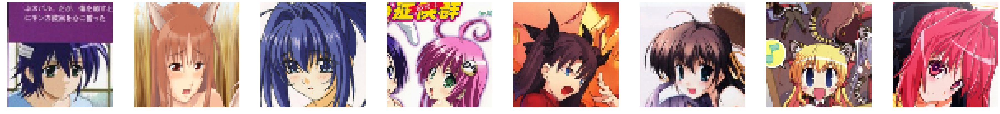

In [8]:
# Import Data
from PIL import Image
import re
# Care has been taken to rid of images that are too similar/repeated. You can do so using this code.
exclude_img = []

exclude_img = [s + ".png" for s in exclude_img]

print("Image Samples")
#input_images = np.asarray([np.asarray(Image.open(file).resize((IMAGE_SIZE, IMAGE_SIZE))) for file in glob(INPUT_DATA_DIR + '*')])
input_images = np.asarray([np.asarray(Image.open(file).resize((IMAGE_SIZE, IMAGE_SIZE))) for file in glob(INPUT_DATA_DIR + '*') if file not in exclude_img])

print ("Input: " + str(input_images.shape))

np.random.shuffle(input_images)

sample_images = random.sample(list(input_images), SAMPLES_TO_SHOW)
show_samples(sample_images, OUTPUT_DIR + "inputs", 0)

Training Starts!
Instructions for updating:
Use tf.cast instead.
Epoch 1/50 
Duration: 36.86033 
D Loss: 1.47396 
G Loss: 1.29840


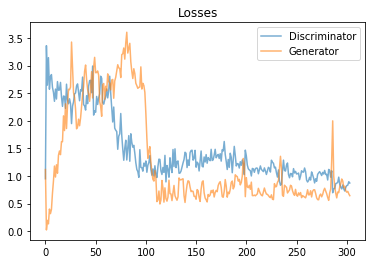

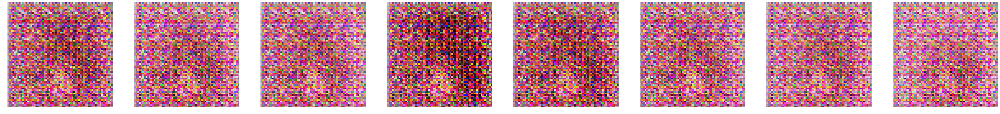

Epoch 2/50 
Duration: 29.33880 
D Loss: 0.80002 
G Loss: 0.79680


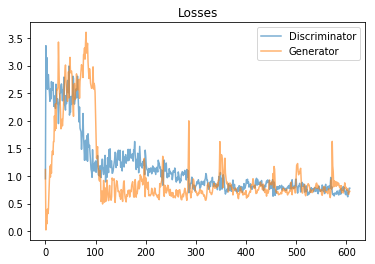

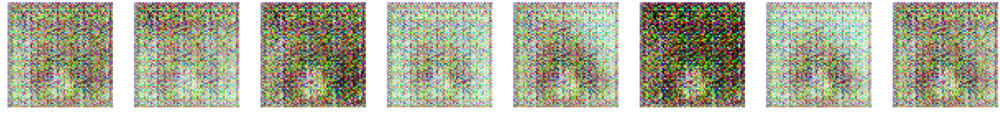

Epoch 3/50 
Duration: 29.41352 
D Loss: 0.78815 
G Loss: 0.67320


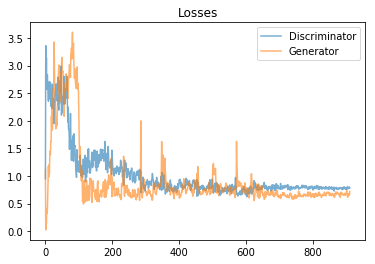

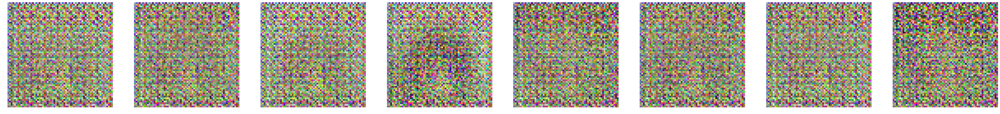

Epoch 4/50 
Duration: 29.37116 
D Loss: 0.75913 
G Loss: 0.67630


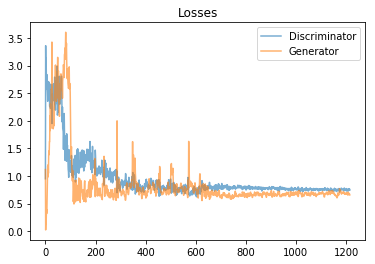

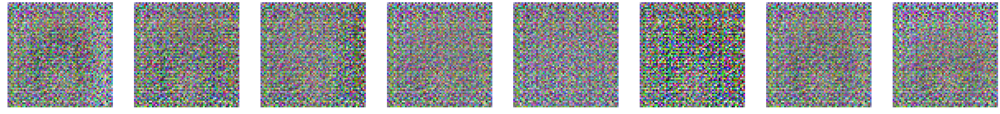

Epoch 5/50 
Duration: 29.40264 
D Loss: 0.73625 
G Loss: 0.69500


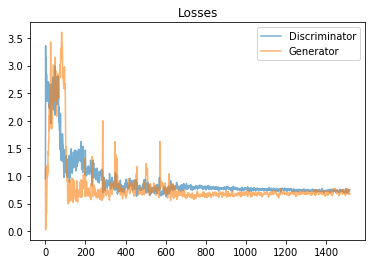

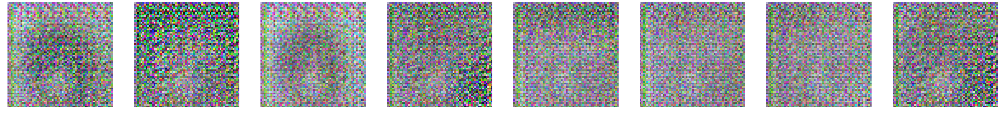

Epoch 6/50 
Duration: 29.36413 
D Loss: 0.72439 
G Loss: 0.71563


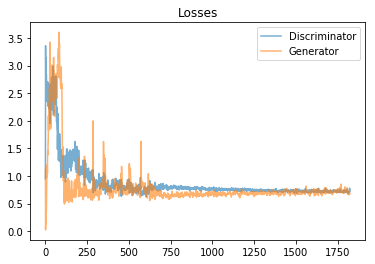

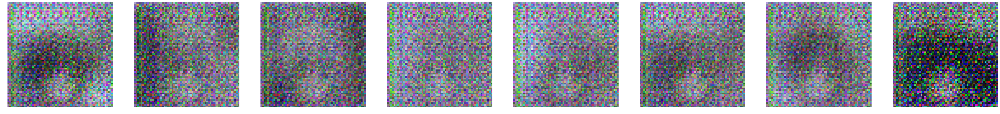

Epoch 7/50 
Duration: 29.31400 
D Loss: 0.71840 
G Loss: 0.72049


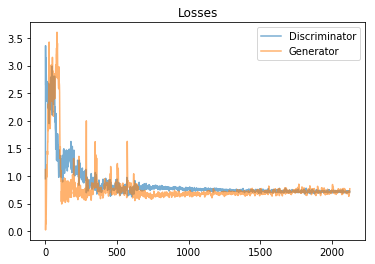

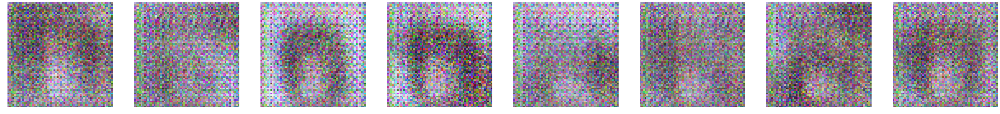

Epoch 8/50 
Duration: 29.40394 
D Loss: 0.71590 
G Loss: 0.72236


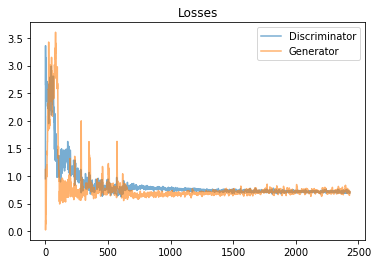

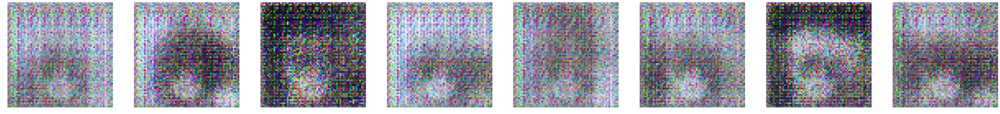

Epoch 9/50 
Duration: 29.36609 
D Loss: 0.71247 
G Loss: 0.73092


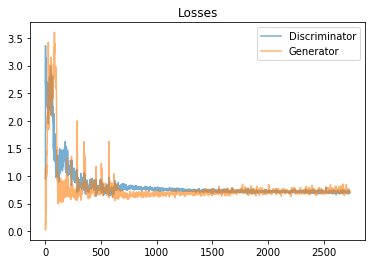

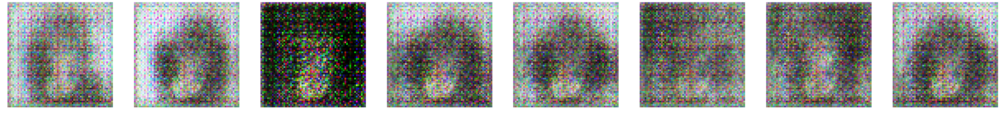

Epoch 10/50 
Duration: 29.43702 
D Loss: 0.71172 
G Loss: 0.72851


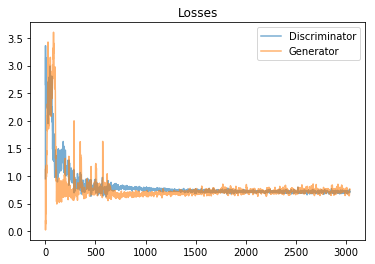

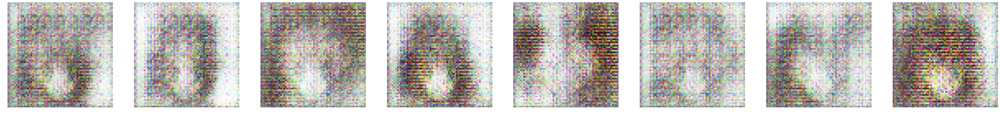

Epoch 11/50 
Duration: 29.36087 
D Loss: 0.71155 
G Loss: 0.72615


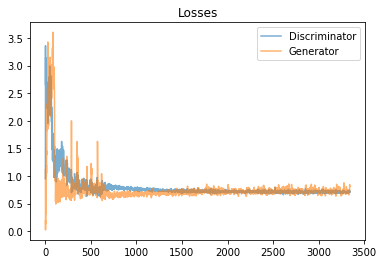

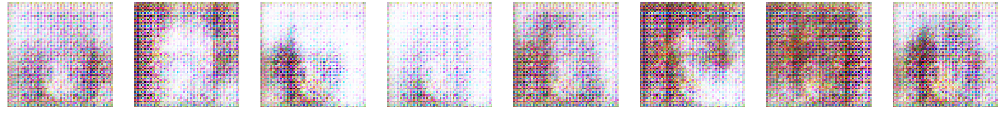

Epoch 12/50 
Duration: 29.39385 
D Loss: 0.70955 
G Loss: 0.72152


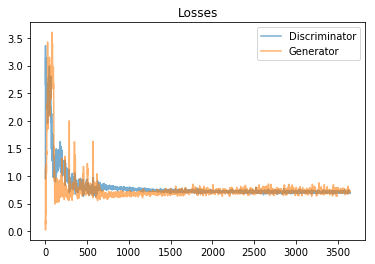

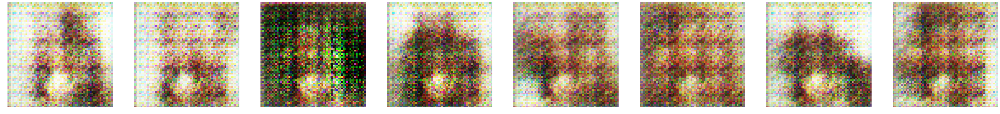

Epoch 13/50 
Duration: 29.45046 
D Loss: 0.70946 
G Loss: 0.72412


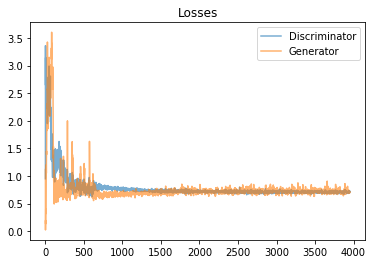

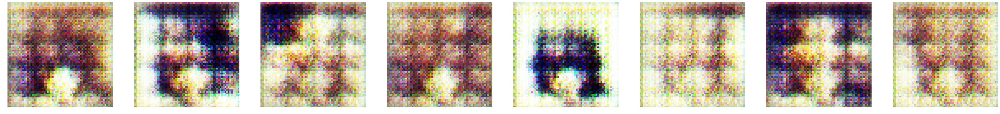

Epoch 14/50 
Duration: 29.43802 
D Loss: 0.70813 
G Loss: 0.72174


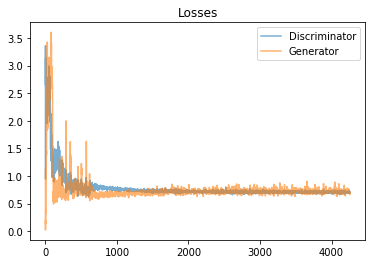

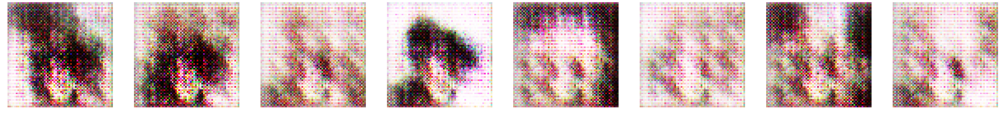

Epoch 15/50 
Duration: 29.41328 
D Loss: 0.70484 
G Loss: 0.73538


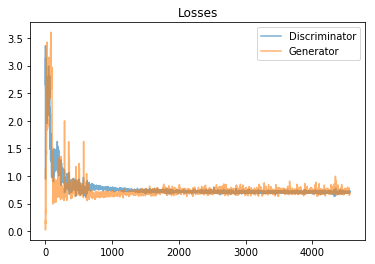

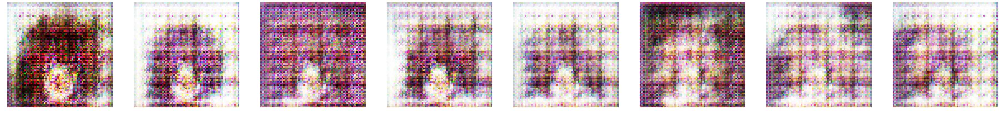

Epoch 16/50 
Duration: 29.36735 
D Loss: 0.70746 
G Loss: 0.72161


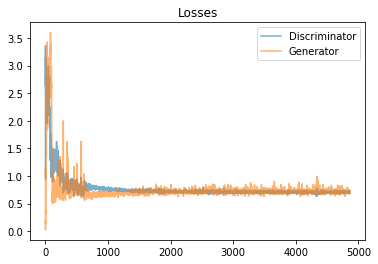

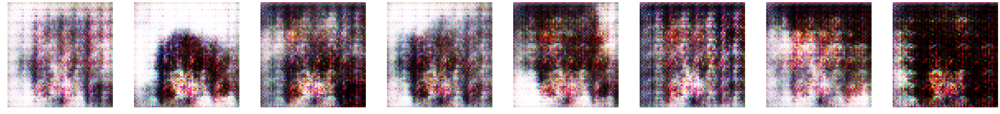

Epoch 17/50 
Duration: 29.38872 
D Loss: 0.70647 
G Loss: 0.72418


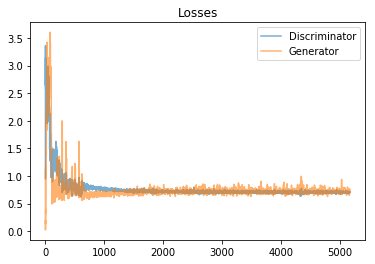

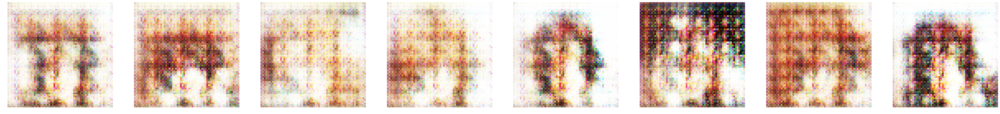

Epoch 18/50 
Duration: 29.39865 
D Loss: 0.70629 
G Loss: 0.71445


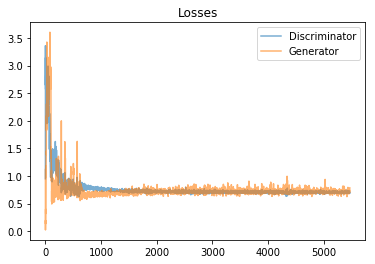

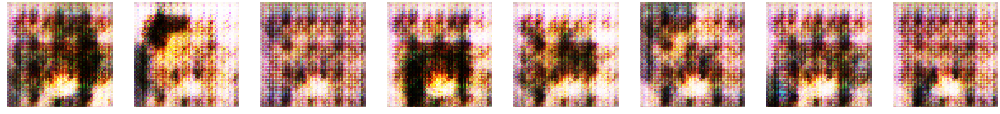

Epoch 19/50 
Duration: 29.41763 
D Loss: 0.69991 
G Loss: 0.73574


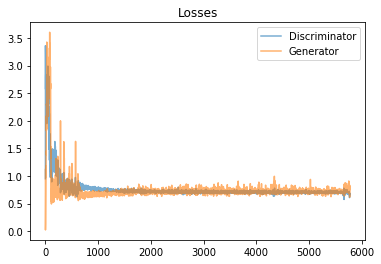

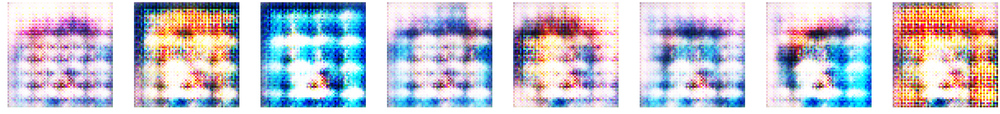

saving model
Epoch 20/50 
Duration: 30.19085 
D Loss: 0.67563 
G Loss: 0.74016


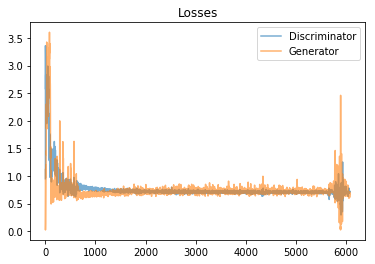

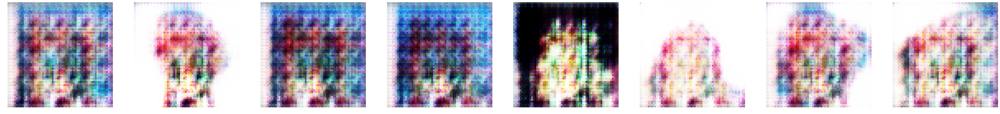

Epoch 21/50 
Duration: 29.38962 
D Loss: 0.70838 
G Loss: 0.72650


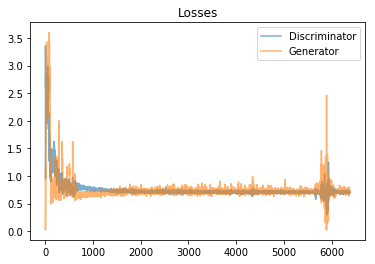

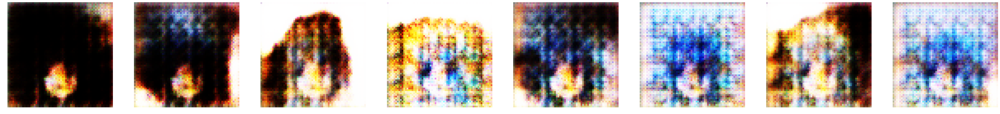

Epoch 22/50 
Duration: 29.36682 
D Loss: 0.69960 
G Loss: 0.73157


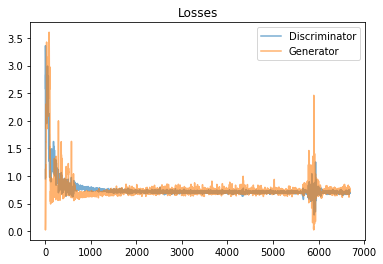

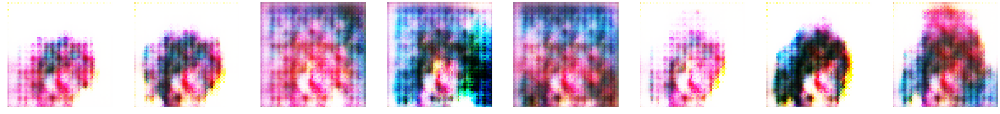

Epoch 23/50 
Duration: 29.43608 
D Loss: 0.70321 
G Loss: 0.73886


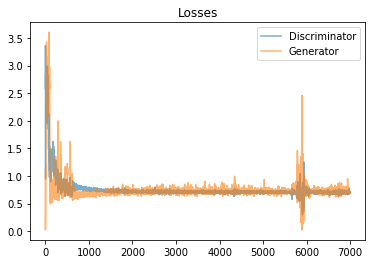

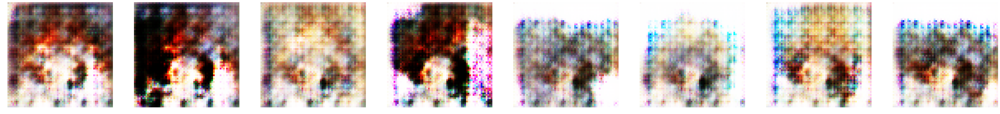

Epoch 24/50 
Duration: 29.40086 
D Loss: 0.70365 
G Loss: 0.72808


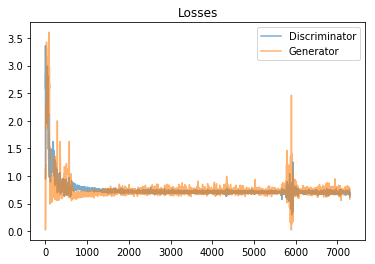

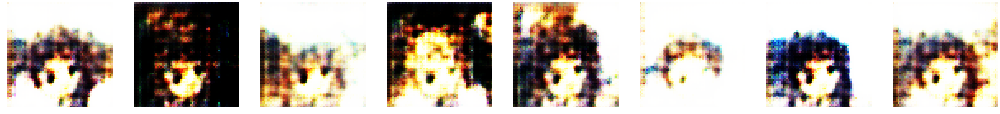

Epoch 25/50 
Duration: 29.32693 
D Loss: 0.68584 
G Loss: 0.77324


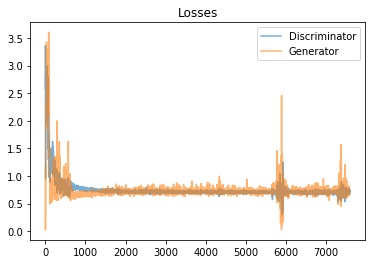

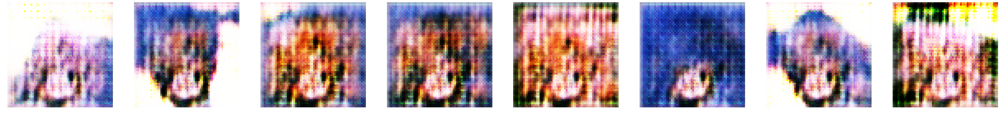

Epoch 26/50 
Duration: 29.38515 
D Loss: 0.71034 
G Loss: 0.72111


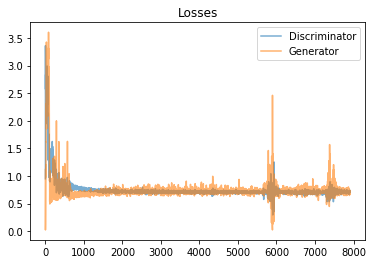

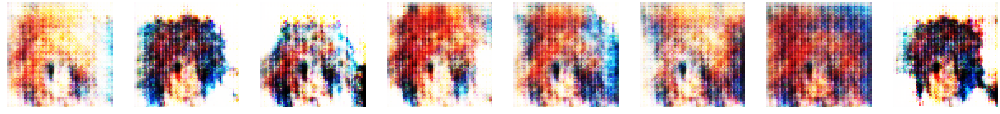

Epoch 27/50 
Duration: 29.34287 
D Loss: 0.70003 
G Loss: 0.71841


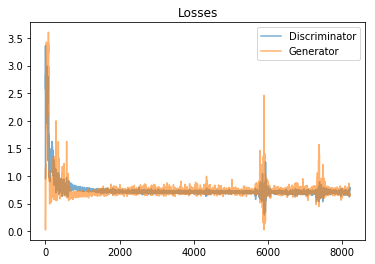

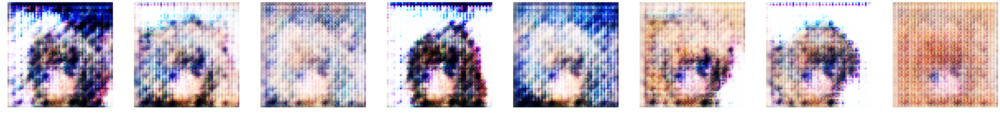

Epoch 28/50 
Duration: 29.40669 
D Loss: 0.68538 
G Loss: 0.73197


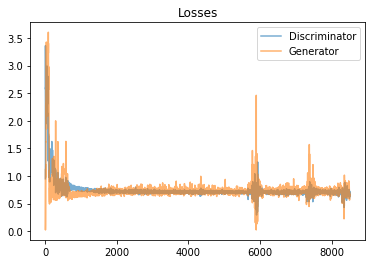

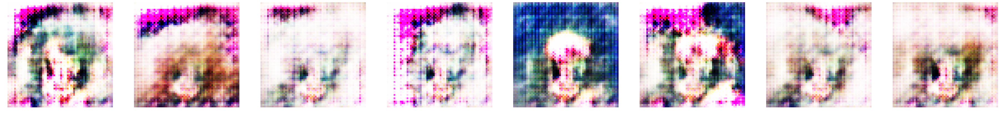

Epoch 29/50 
Duration: 29.33354 
D Loss: 0.69693 
G Loss: 0.70030


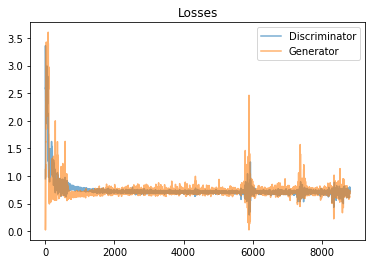

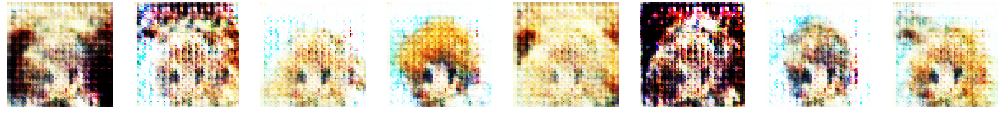

Epoch 30/50 
Duration: 29.32162 
D Loss: 0.70253 
G Loss: 0.71519


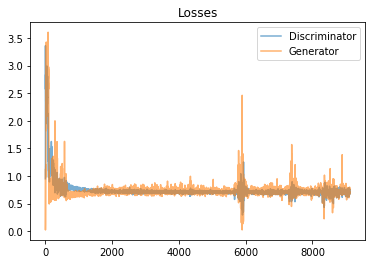

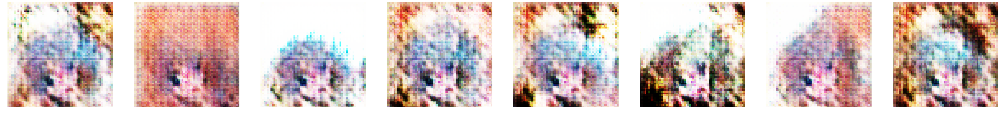

Epoch 31/50 
Duration: 29.31975 
D Loss: 0.70562 
G Loss: 0.70279


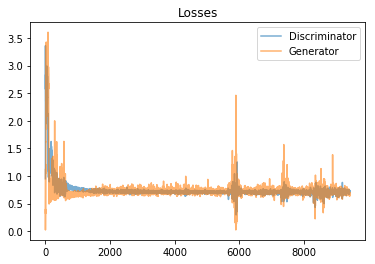

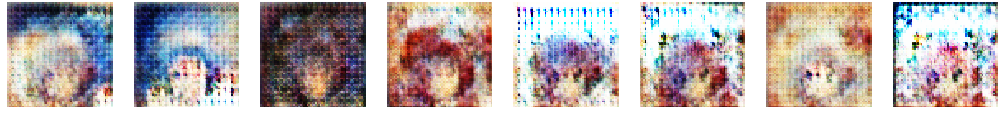

Epoch 32/50 
Duration: 29.43545 
D Loss: 0.70386 
G Loss: 0.70702


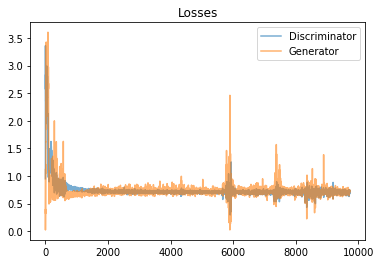

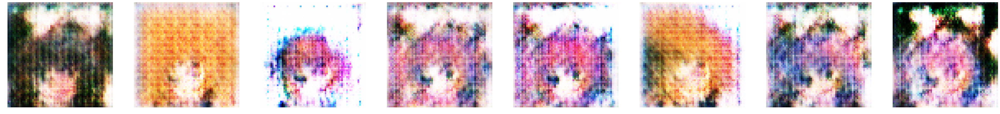

Epoch 33/50 
Duration: 29.33241 
D Loss: 0.69778 
G Loss: 0.70088


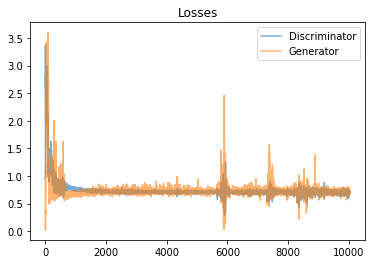

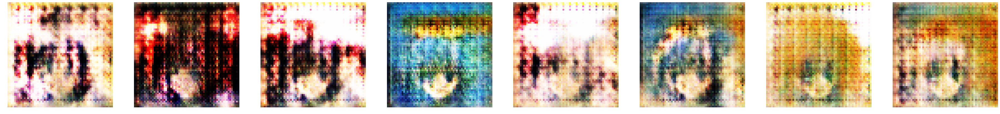

Epoch 34/50 
Duration: 29.36743 
D Loss: 0.70442 
G Loss: 0.70884


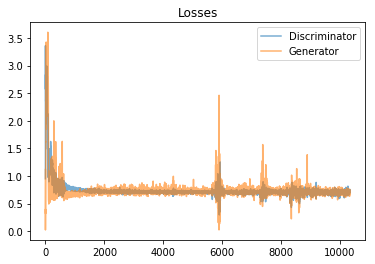

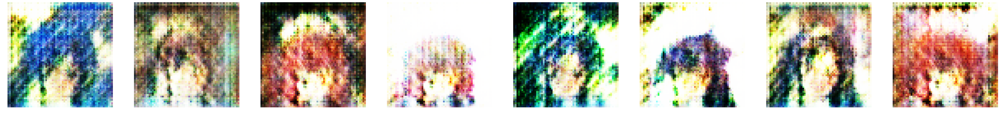

Epoch 35/50 
Duration: 29.32210 
D Loss: 0.70281 
G Loss: 0.70056


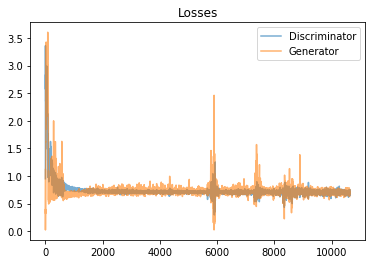

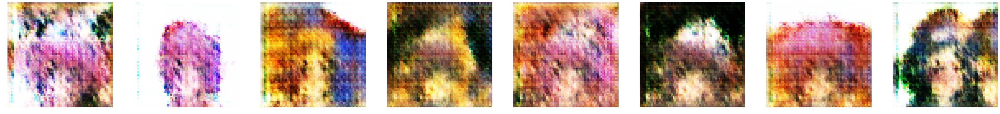

Epoch 36/50 
Duration: 29.34649 
D Loss: 0.69785 
G Loss: 0.70398


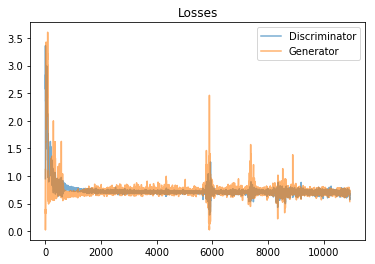

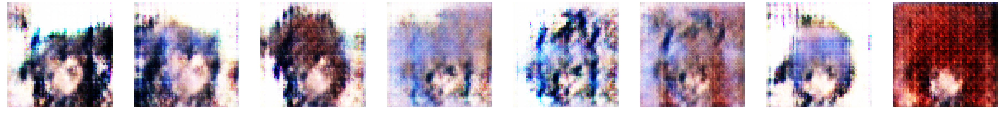

Epoch 37/50 
Duration: 29.36973 
D Loss: 0.69690 
G Loss: 0.70896


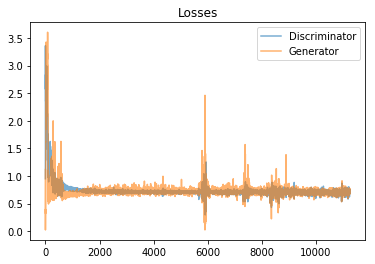

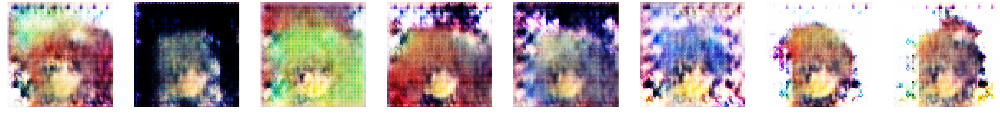

Epoch 38/50 
Duration: 29.39061 
D Loss: 0.69444 
G Loss: 0.70395


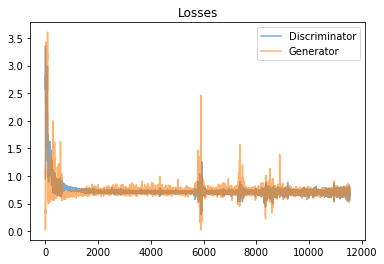

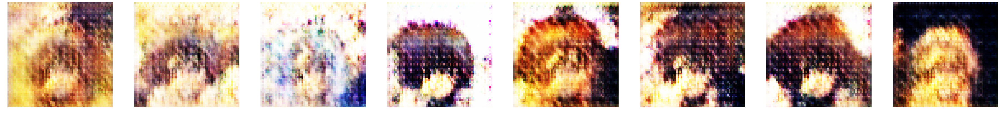

Epoch 39/50 
Duration: 29.33119 
D Loss: 0.70499 
G Loss: 0.69917


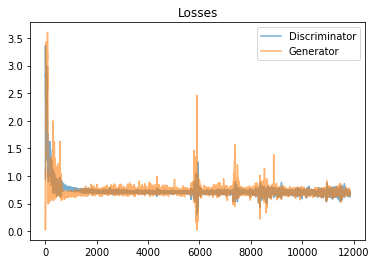

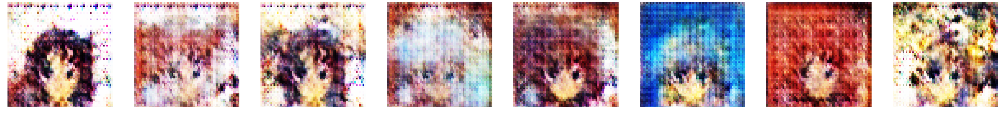

saving model
Epoch 40/50 
Duration: 29.44213 
D Loss: 0.69115 
G Loss: 0.69516


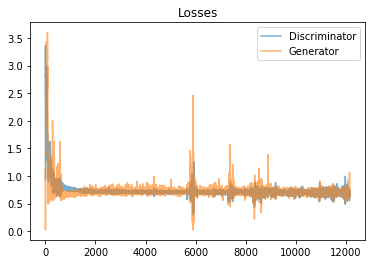

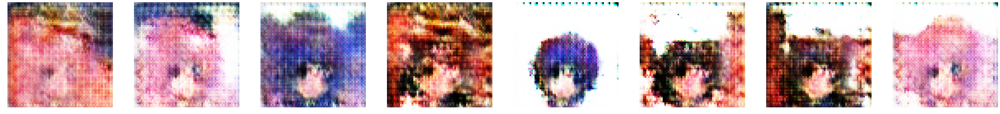

Epoch 41/50 
Duration: 29.45494 
D Loss: 0.70465 
G Loss: 0.70010


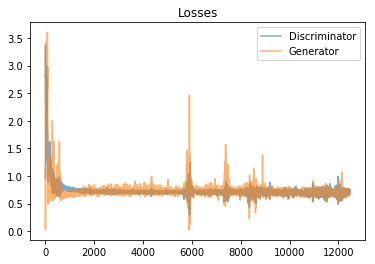

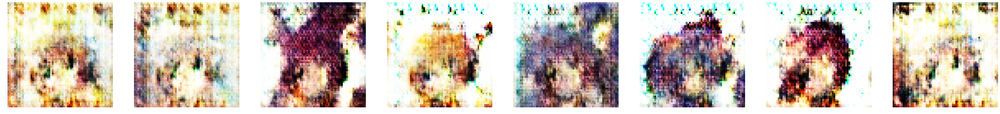

Epoch 42/50 
Duration: 29.25575 
D Loss: 0.70009 
G Loss: 0.69619


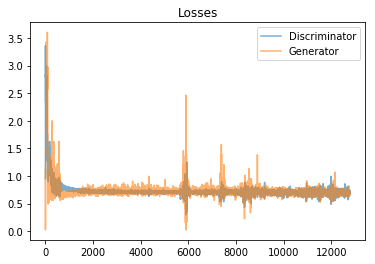

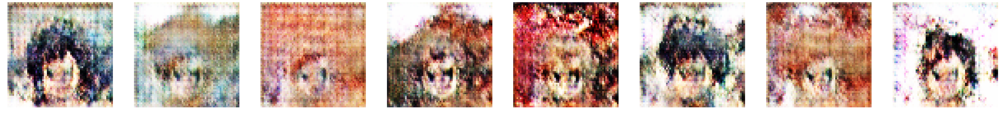

Epoch 43/50 
Duration: 29.30407 
D Loss: 0.70135 
G Loss: 0.69479


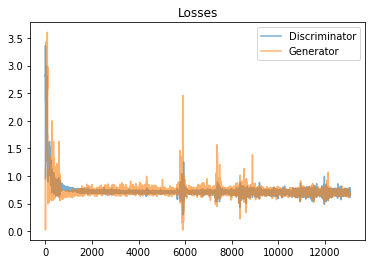

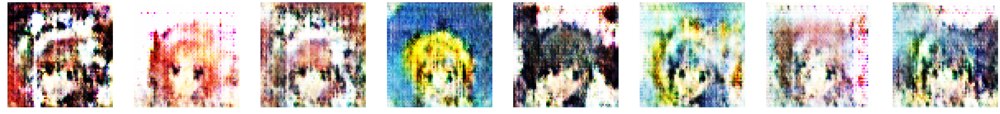

Epoch 44/50 
Duration: 29.30795 
D Loss: 0.70192 
G Loss: 0.69163


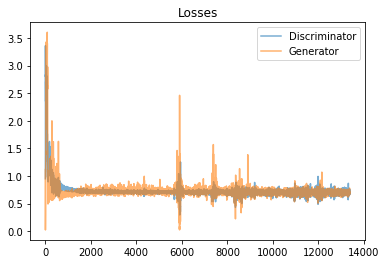

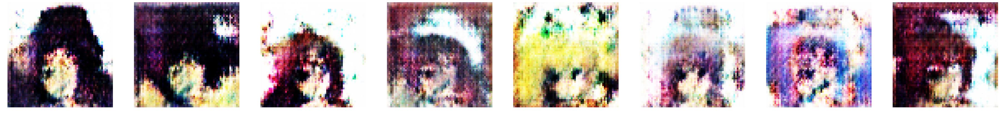

Epoch 45/50 
Duration: 29.20781 
D Loss: 0.70076 
G Loss: 0.69345


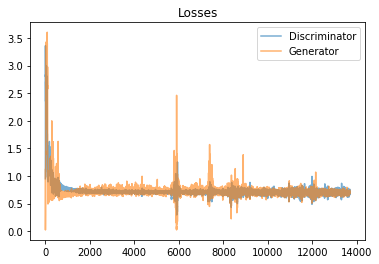

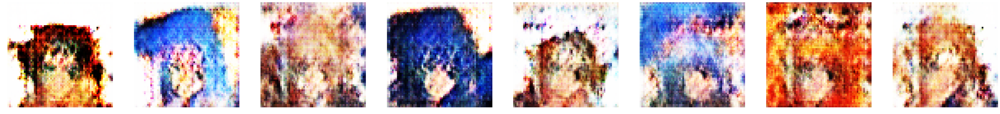

Epoch 46/50 
Duration: 29.27630 
D Loss: 0.70083 
G Loss: 0.68949


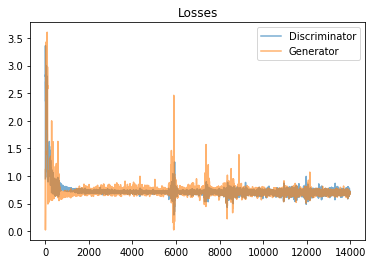

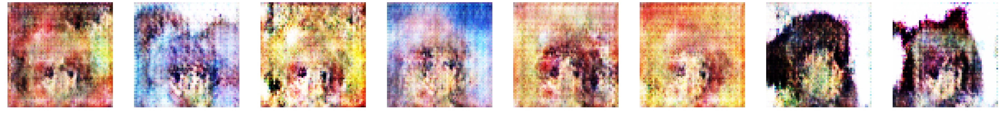

Epoch 47/50 
Duration: 29.33377 
D Loss: 0.70326 
G Loss: 0.69343


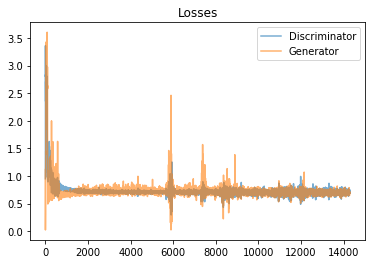

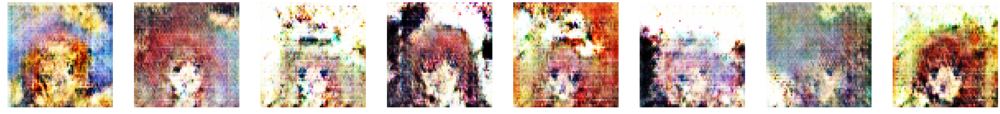

Epoch 48/50 
Duration: 29.29138 
D Loss: 0.69930 
G Loss: 0.68602


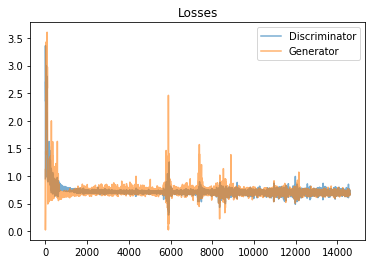

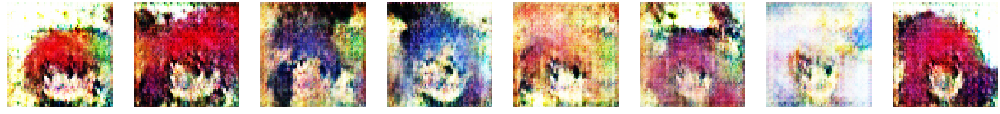

Epoch 49/50 
Duration: 29.24796 
D Loss: 0.70071 
G Loss: 0.68430


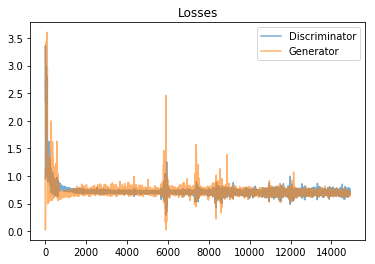

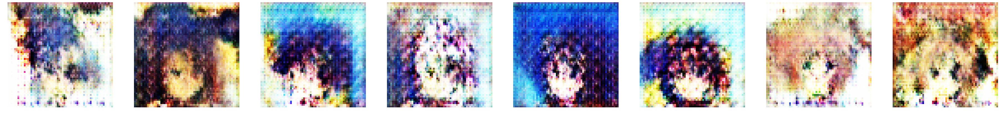

Epoch 50/50 
Duration: 29.33626 
D Loss: 0.70159 
G Loss: 0.68520


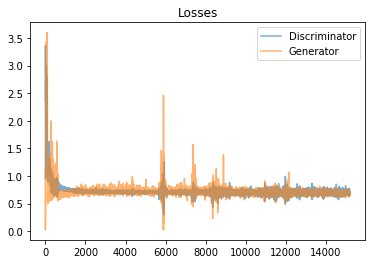

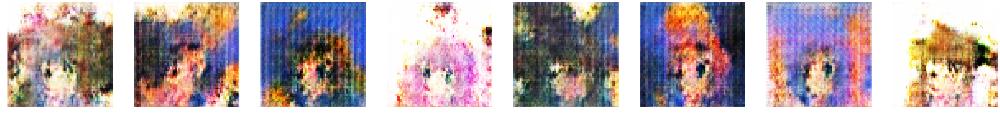

In [9]:
#Training
print("Training Starts!")

warnings.filterwarnings("ignore")

d_losses = []
g_losses = []
cum_d_loss = 0
cum_g_loss = 0

#EPOCHS = 10
for epoch in range(EPOCHS):
    epoch += 1
    start_time = time.time()
    
    for batch_images in get_batches(input_images):
        
        noise_data = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_SIZE))
        # We use same labels for generated images as in the real training batch
        generated_images = generator.predict(noise_data)
        
        noise_prop = 0.05 # Randomly flip 5% of targets
        real_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
        flipped_idx = np.random.choice(np.arange(len(real_labels)), size=int(noise_prop*len(real_labels)))
        real_labels[flipped_idx] = 1 - real_labels[flipped_idx]
        
        # Train discriminator on real data
        d_loss_real = discriminator.train_on_batch(batch_images, real_labels)


        # Prepare labels for generated data
        fake_labels = np.ones((BATCH_SIZE, 1)) - np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
        flipped_idx = np.random.choice(np.arange(len(fake_labels)), size=int(noise_prop*len(fake_labels)))
        fake_labels[flipped_idx] = 1 - fake_labels[flipped_idx]
        
        # Train discriminator on generated data
        d_loss_fake = discriminator.train_on_batch(generated_images, fake_labels)
        
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        cum_d_loss += d_loss
        d_losses.append(d_loss[0])
        
        
        # Train generator
        noise_data = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_SIZE))
        g_loss = gan.train_on_batch(noise_data, np.zeros((BATCH_SIZE, 1)))
        cum_g_loss += g_loss
        g_losses.append(g_loss)
        
    if epoch > 0 and epoch % 20 == 0 :
        print("saving model")
        discriminator.save_weights("desc-simposon-model.h5-" + str(epoch))
        gan.save_weights("gan-simposon-model.h5-" + str(epoch))
        
    # Plot the progress
    summarize_epoch(d_losses, g_losses, input_images.shape, epoch, time.time()-start_time, noise_data)